# Opti-flood: Instance segmentation

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import torch

from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset
from torchvision import transforms
from torch.utils.data import DataLoader, SubsetRandomSampler
import torch.nn.functional as F
import torch.nn as nn
from torchvision import models
import torch.optim as optim


from sklearn.metrics import confusion_matrix, accuracy_score, f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import classification_report
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestClassifier

import albumentations as A
import albumentations.pytorch as AP
import random

import os
import re
import tifffile
from PIL import Image
from skimage import io
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Config !

In [ ]:
root_dir = "/content/drive/MyDrive/opti-flood/Dataset_full"

bands=[0,1,2,3,4,5,6,7,8,9,10,11]

# For resnet
in_channels=21
out_channels=1



# Dataset

In [ ]:
# Dataset
class DataCube_Dataset(Dataset):
    def __init__(self, root_dir, bands, phase='train', transform=None):
        self.train_dir = os.path.join(root_dir, 'train')
        self.image_folder = os.path.join(self.train_dir, 'images')
        self.mask_folder = os.path.join(self.train_dir, 'labels')
        self.test_folder = os.path.join(root_dir, 'val/images')
        self.phase = phase

        # Load all image and label (mask) names and sort them
        if phase == "test":
            self.image_list = sorted([filename for filename in os.listdir(self.test_folder) if filename.endswith('.tif')])
        else:
            self.image_list = sorted([filename for filename in os.listdir(self.image_folder) if filename.endswith('.tif')])
            self.mask_list = sorted([filename for filename in os.listdir(self.mask_folder) if filename.endswith('.png')])
            # Split the dataset into train and validation sets
            self.train_image_list, self.val_image_list, self.train_mask_list, self.val_mask_list = train_test_split(
                self.image_list, self.mask_list, test_size=0.1, random_state=42, # stratify=self.mask_list # add stratify based on flood/not flood pixel ratio
            )
        self.bands = bands

        self.transform = transform

    def __len__(self):
        if self.phase == 'train':
            return len(self.train_image_list)
        elif self.phase == 'val':
            return len(self.val_mask_list)
        elif self.phase == 'test':
            return len(self.image_list)

    def __getitem__(self, idx):
        if self.phase == 'train':
            img_name = os.path.join(self.image_folder, self.train_image_list[idx])
            mask_name = os.path.join(self.mask_folder, self.train_mask_list[idx])
        elif self.phase == 'val':
            img_name = os.path.join(self.image_folder, self.val_image_list[idx])
            mask_name = os.path.join(self.mask_folder, self.val_mask_list[idx])
        elif self.phase == 'test':
            img_name = os.path.join(self.test_folder, self.image_list[idx])

        if self.phase != 'test':
            # Ensure that image number and label number match
            image_number = os.path.splitext(self.image_list[idx])[0]
            mask_number = os.path.splitext(self.mask_list[idx])[0]

            assert image_number == mask_number, f"Image number {image_number} does not match label number {mask_number}."

            mask = io.imread(mask_name).astype('float32')

        image = io.imread(img_name)[:,:,self.bands].astype('float32')


        if self.transform:
            if self.phase == 'test':
                transformed = self.transform(image=image)
                image = transformed['image']
                return {'image': image, 'image_name': self.image_list[idx]}
            else:
                transformed = self.transform(image=image, mask=mask)
                image = transformed['image']
                mask = transformed['mask'].reshape((1, mask.shape[0], mask.shape[1]))
                return {'image': image, 'mask': mask, 'image_name': self.image_list[idx], 'mask_name': self.mask_list[idx]}
        else:
            if self.phase != 'test':
                return {'image': image, 'mask': mask, 'image_name': self.image_list[idx], 'mask_name': self.mask_list[idx]}
            else:
                return {'image': image, 'image_name': self.image_list[idx]}

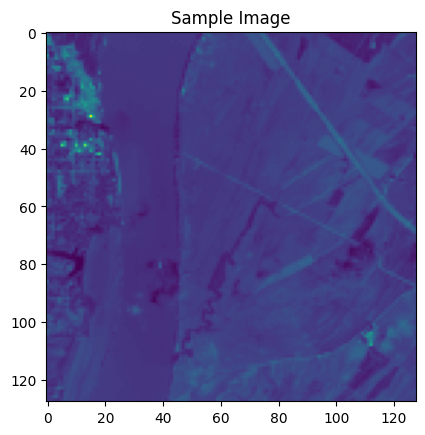

Image Shape: (128, 128, 12)


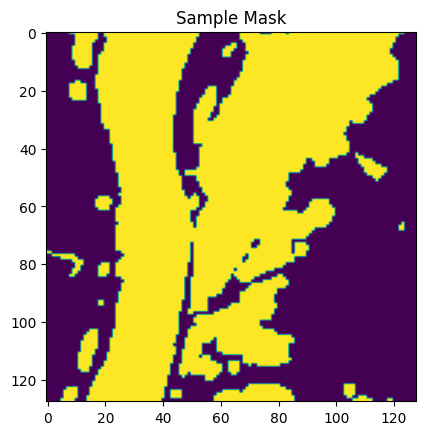

Mask Shape: (128, 128)
Length of the training dataset: 275
Length of the validation dataset: 31
Length of the test dataset: 125


In [ ]:
# Create instance of train dataset
train_dataset = DataCube_Dataset(root_dir=root_dir, bands=bands, phase='train', transform=None)
# Access one image
sample = train_dataset[20]
image = sample['image']

# Plot the image
plt.imshow(image[:,:,3])

plt.title('Sample Image')
plt.show()
print(f"Image Shape: {image.shape}")

# Plot the mask
mask = sample['mask']
plt.imshow(mask)
plt.title('Sample Mask')
plt.show()
print(f"Mask Shape: {mask.shape}")


# Check length of train
len_train_dataset = len(train_dataset)
print(f"Length of the training dataset: {len_train_dataset}")

# Check length valid
val_dataset = DataCube_Dataset(root_dir=root_dir, bands=bands, phase='val', transform=None)
len_val_dataset = len(val_dataset)
print(f"Length of the validation dataset: {len_val_dataset}")

# Check length of test
test_dataset = DataCube_Dataset(root_dir=root_dir, bands=bands, phase='test', transform=None)
len_test_dataset = len(test_dataset)
print(f"Length of the test dataset: {len_test_dataset}")

## Transformations

Let's applly transformations

In [ ]:
qa_dict = {64: '0', 96: '1', 160: '1', 128: '0', 192: '0', 112: '1', 80: '0', 224: '1', 176: '1', 144: '0', 208: '1', 68: '0', 76: '0', 72: '0', 136: '0', 200: '0', 198: '0', 194: '0', 130: '0', 196: '0', 132: '0', 140: '0', 204: '0', 134: '0', 70: '0', 240: '1', 164: '1', 255: '1', 84: '0', 66: '0', 100: '1', 138: '0', 202: '0', 142: '0', 74: '0', 78: '0', 206: '0', 228: '1', 148: '1', 244: '1', 116: '1'}

# Convert values to integers
qa_dict_int = {key: int(value) for key, value in qa_dict.items()}

print(qa_dict_int)
qa_list= []
for key, value in qa_dict.items():
  qa_list.append(key)
print(qa_list)

{64: 0, 96: 1, 160: 1, 128: 0, 192: 0, 112: 1, 80: 0, 224: 1, 176: 1, 144: 0, 208: 1, 68: 0, 76: 0, 72: 0, 136: 0, 200: 0, 198: 0, 194: 0, 130: 0, 196: 0, 132: 0, 140: 0, 204: 0, 134: 0, 70: 0, 240: 1, 164: 1, 255: 1, 84: 0, 66: 0, 100: 1, 138: 0, 202: 0, 142: 0, 74: 0, 78: 0, 206: 0, 228: 1, 148: 1, 244: 1, 116: 1}
[64, 96, 160, 128, 192, 112, 80, 224, 176, 144, 208, 68, 76, 72, 136, 200, 198, 194, 130, 196, 132, 140, 204, 134, 70, 240, 164, 255, 84, 66, 100, 138, 202, 142, 74, 78, 206, 228, 148, 244, 116]


In [ ]:

def Normalize_Custom(image, cols, rows):
    image = image.astype(np.float32)
    for i,band in enumerate(bands):
        image[:,:,i] = (image[:,:,i] - min_values[band]) / (max_values[band] - min_values[band])
    return image

def Standardize_Custom(image, cols, rows):
    #qa_dict = {64: 0, 96: 1, 160: 1, 128: 0, 192: 0, 112: 1, 80: 0, 224: 1, 176: 1, 144: 0, 208: 1, 68: 0, 76: 0, 72: 0, 136: 0, 200: 0, 198: 0, 194: 0, 130: 0, 196: 0, 132: 0, 140: 0, 204: 0, 134: 0, 70: 0, 240: 1, 164: 1, 255: 1, 84: 0, 66: 0, 100: 1, 138: 0, 202: 0, 142: 0, 74: 0, 78: 0, 206: 0, 228: 1, 148: 1, 244: 1, 116: 1}
    qa_list = [64, 96, 160, 128, 192, 112, 80, 224, 176, 144, 208, 68, 76, 72, 136, 200, 198, 194, 130, 196, 132, 140, 204, 134, 70, 240, 164, 255, 84, 66, 100, 138, 202, 142, 74, 78, 206, 228, 148, 244, 116]
    image = image.astype(np.float32)
    for i, band in enumerate(bands):
        if band == 10:
            # One-hot encode the 10th band with 10 classes
            encoded_band = np.eye(10)[((image[:, :, i] - 10) // 10).astype(int)]
            image = np.concatenate((image[:, :, :i], encoded_band, image[:, :, i+1:]), axis=-1)
        # elif band == 7:
        # #     # Map band values to new values based on the dictionary
        # #     image[:, :, i] = np.vectorize(lambda x: qa_dict.get(x, x))(image[:, :, i])
        #     encoded_band = np.eye(41)[((image[:, :, i] - 41) // 41).astype(int)]
        #     image = np.concatenate((image[:, :, :i], encoded_band, image[:, :, i+1:]), axis=-1)
        # if band == 10:
        #     # One-hot encode the 10th band with 10 classes
        #     encoded_band = np.eye(10)[(image[:, :, i] - 1).astype(int)]
        #     image = np.concatenate((image[:, :, :i], encoded_band, image[:, :, i+1:]), axis=-1)
        # elif band == 7:
        #     # Map band values to indices [0, 40]
        #     value_to_index = {value: idx for idx, value in enumerate(qa_list)}
        #     encoded_band = np.eye(41)[np.vectorize(value_to_index.get)(image[:, :, i])]
        #     image = np.concatenate((image[:, :, :i], encoded_band, image[:, :, i+1:]), axis=-1)


        else:
            # Standard normalization for other bands
            image[:, :, i] = (image[:, :, i] - mean_values[band]) / std_values[band]

    return image

# Mean values
mean_values = [396.4676729090074, 494.62102872561786, 822.3197845259523, 973.6749612646165, 2090.1109964208667, 1964.050569023182, 1351.2739533069087, 102.73963040619894, 141.80390640956904, 300.74136252808415, 35.10253307866115, 9.753326416015625]

# Standard deviation values
std_values = [270.0665930689999, 325.9791968534612, 418.1216302140401, 586.7029751589066, 1055.984607199741, 1191.4222656087081, 961.7625875864017, 48.80401526687052, 1364.9811211468623, 496.0388072260607, 20.184524568480853, 27.75830661807713]

#Maximum values
max_values = [6568, 9659, 11368, 12041, 15841, 15252, 14647, 255, 4245, 4287, 100, 111]
min_values = [-1393, -1169, -722, -684, -412, -335, -258, 64, -9999, 8, 10, 0]

transforms_Augmented = A.Compose([
    A.Lambda(image=Standardize_Custom),
    A.OneOf([
        A.RandomSizedCrop(min_max_height=(50, 101), height=128, width=128, p=0.5),
        A.PadIfNeeded(min_height=128, min_width=128, p=0.5)
    ],p=1),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.OneOf([
        A.ElasticTransform(p=0.5, alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03),
        A.GridDistortion(p=0.5),
        A.OpticalDistortion(distort_limit=1, shift_limit=0.5, p=1),
    ]),

    #A.Lambda(image=Standardize_Custom),
    AP.transforms.ToTensorV2(),
])

transforms_Normalized = A.Compose([
    A.Lambda(image=Standardize_Custom),
    AP.transforms.ToTensorV2(),
])

no_transforms = A.Compose([
    AP.transforms.ToTensorV2(),
])
# no_grad_transform = transforms.Compose([
#     transforms.ToTensor(),
# ])


In [ ]:
# Create an instance of the custom dataset for the training phase
train_dataset = DataCube_Dataset(root_dir=root_dir, bands=bands, phase='train', transform=transforms_Normalized)

# Access one image from the dataset (for example, the 21st image)
sample = train_dataset[20]
image = sample['image']
print(image)

# Check the shape of the image
print(f"Image Shape: {image.shape}")

tensor([[[ 2.8338e-01,  2.8338e-01, -4.9420e-01,  ..., -1.2840e-02,
          -3.3498e-01, -3.3498e-01],
         [ 2.8338e-01,  2.8338e-01, -4.9420e-01,  ..., -1.2840e-02,
          -3.3498e-01, -3.3498e-01],
         [ 1.5497e+00,  1.5497e+00, -2.7651e-02,  ..., -4.3126e-01,
          -5.4974e-01, -5.4974e-01],
         ...,
         [-3.2387e-01, -3.2387e-01,  2.4265e-01,  ..., -3.7571e-01,
          -3.2387e-01, -3.2387e-01],
         [-3.0536e-01, -3.0536e-01, -6.8382e-02,  ..., -4.0534e-01,
          -4.0904e-01, -4.0904e-01],
         [-3.0536e-01, -3.0536e-01, -6.8382e-02,  ..., -4.0534e-01,
          -4.0904e-01, -4.0904e-01]],

        [[ 2.7419e-01, -7.8110e-01, -8.8233e-01,  ...,  1.2080e-01,
          -2.1664e-01, -3.6389e-01],
         [ 1.2681e+00,  3.6008e-01, -5.2341e-01,  ..., -3.6696e-01,
          -4.0991e-01, -4.2218e-01],
         [ 1.9001e+00,  1.5442e+00, -5.2034e-01,  ..., -4.4365e-01,
          -4.5285e-01, -4.9273e-01],
         ...,
         [-3.2708e-01, -4

## Examine data loader

Dataloader return shape (height,widths, bands). This interesting as our dataset return shape of (bands, height,widths)

In [ ]:

train_dataset = DataCube_Dataset(root_dir=root_dir, bands=bands, phase='train', transform=transforms_Normalized)

batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

for batch in train_loader:
    sample = batch
    image = sample['image']
    mask = sample['mask']

    # Inspect the shape of the image and mask
    print(f"Image Shape: {image.shape}")
    print(f"Mask Shape: {mask.shape}")

    break

Image Shape: torch.Size([16, 21, 128, 128])
Mask Shape: torch.Size([16, 1, 128, 128])


# Train model

In [ ]:
# Not bad model from ChatGPT
class CustomSegmentationModel(nn.Module):
    def __init__(self, in_channels):
        super(CustomSegmentationModel, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        # Bottleneck
        self.bottleneck = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)  # Upsampling to maintain the input resolution
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.Conv2d(64, 1, kernel_size=1),  # Output layer with binary classification
            nn.Sigmoid()  # Sigmoid activation for binary classification
        )

    def forward(self, x):
        x1 = self.encoder(x)
        x2 = self.bottleneck(x1)
        x3 = self.decoder(x2)

        return x3

# Create an instance of the custom segmentation model
custom_segmentation_model = CustomSegmentationModel(in_channels)

# Display the model architecture
print(custom_segmentation_model)
model = custom_segmentation_model

CustomSegmentationModel(
  (encoder): Sequential(
    (0): Conv2d(21, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (bottleneck): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): ConvTranspose2d(128, 64, kernel_size=(2, 2), stride=(2, 2))
  )
  (decoder): Sequential(
    (0): Conv2d(64, 1, kernel_size=(1, 1), stride=(1, 1))
    (1): Sigmoid()
  )
)


In [ ]:
class CustomResNetSegmentationModel(nn.Module):
    def __init__(self, in_channels):
        super(CustomResNetSegmentationModel, self).__init__()

        # Load a pre-trained ResNet18 model
        resnet = models.resnet18(pretrained=False)

        # Modify the first layer to accept 20 input channels
        resnet.conv1 = nn.Conv2d(in_channels, 64, kernel_size=7, stride=2, padding=3, bias=False)

        # Remove the last classification layer
        self.features = nn.Sequential(*list(resnet.children())[:-2])

        # Add custom segmentation layers
        self.decoder = nn.Sequential(
            nn.Conv2d(512, 1, kernel_size=1)  # Output with num_classes channels
        )

    def forward(self, x):
        x = self.features(x)
        x = self.decoder(x)
        x = F.interpolate(x, size=(128, 128), mode='bilinear', align_corners=False)  # Resize to match target size
        return x

# Create an instance of the custom ResNet segmentation model
custom_resnet_segmentation_model = CustomResNetSegmentationModel(in_channels)

# Display the model architecture
print(custom_resnet_segmentation_model)
model = custom_resnet_segmentation_model

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


CustomResNetSegmentationModel(
  (features): Sequential(
    (0): Conv2d(21, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, t

In [ ]:
# Potential loss function
class FocalLoss(nn.Module):
    def __init__(self, alpha=None, gamma=2):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma

    def forward(self, inputs, targets):
        ce_loss = F.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-ce_loss)
        print(targets.shape)
        targets = targets.long()

        loss = (self.alpha[targets] * (1 - pt) ** self.gamma * ce_loss).mean()
        return loss

weights = [0.75, 0.25]
class_weights = torch.FloatTensor(weights, )


band_names = {0: 'Aerosol', 1: 'Blue', 2: 'Green', 3: 'Red', 4: 'NIR', 5: 'SWIR1',
              6: 'SWIR2', 7: 'QA', 8: 'MeritDEM', 9: 'CopernicusDEM', 10: 'LandCover', 11: 'WaterProbability'}

In [ ]:
# Augment

# Instantiate the dataset for training
list_datasets_train = []
list_datasets_val = []

list_datasets_train.append(DataCube_Dataset(root_dir=root_dir, bands=bands, phase='train', transform=transforms_Normalized))
list_datasets_val.append(DataCube_Dataset(root_dir=root_dir, bands=bands, phase='val', transform=transforms_Normalized))

nb_augmentations = 2
for _ in range(0,nb_augmentations):
  list_datasets_train.append(DataCube_Dataset(root_dir=root_dir, bands=bands, phase='train', transform=transforms_Augmented))
  list_datasets_val.append(DataCube_Dataset(root_dir=root_dir, bands=bands, phase='val', transform=transforms_Augmented))

train_dataset = torch.utils.data.ConcatDataset(list_datasets_train)
val_dataset = torch.utils.data.ConcatDataset(list_datasets_val)


# DataLoader
# train_dataset = DataCube_Dataset(root_dir=root_dir, bands=bands, phase='train', transform=transforms_Normalized)
# valid_dataset = DataCube_Dataset(root_dir=root_dir, bands=bands, phase='val', transform=transforms_Normalized)
batch_size = 16
torch.multiprocessing.set_start_method('spawn', force=True)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False)
# Hyperparameters
learning_rate = 0.0001
num_epochs = 50

# Directory to save the trained models
save_dir = '/content/drive/MyDrive/opti-flood/saved_models'
os.makedirs(save_dir, exist_ok=True)

# weight = torch.tensor([0.1, 0.9]) # higher weight for positive class
# criterion = nn.BCEWithLogitsLoss(weight=weight)
# Initialize model, loss function, and optimizer
# pos_weight = torch.tensor([2])  # weight for class 1 / weight for class 0
# criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)
criterion = nn.BCEWithLogitsLoss()
model = CustomResNetSegmentationModel(in_channels)
#criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Other optimizers
# optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)
# optimizer = optim.RMSprop(model.parameters(), lr=learning_rate)
# optimizer = optim.Adagrad(model.parameters(), lr=learning_rate)
# optimizer = optim.Adadelta(model.parameters(), lr=learning_rate)


# Training loop
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for batch in train_loader:
        inputs, labels = batch['image'].float(), batch['mask'].float()

        # Zero the gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(inputs)
        outputs = outputs.squeeze(1)

        labels = labels.squeeze(1)
        labels = labels.squeeze(1)

        # Calculate the loss
        loss = criterion(outputs, labels)

        # Backward pass and optimization
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    average_loss = running_loss / len(train_loader)
    model.eval()  # Set the model to evaluation mode
    val_loss = 0.0
    all_val_preds = []
    all_val_labels = []

    with torch.no_grad():
        for val_batch in val_loader:
            val_inputs, val_labels = val_batch['image'].float(), val_batch['mask'].float()
            val_outputs = model(val_inputs)
            val_outputs = val_outputs.squeeze(1)
            val_labels = val_labels.squeeze(1)

            val_loss += criterion(val_outputs, val_labels).item()

            # Collect predictions and true labels for metrics
            all_val_preds.append(val_outputs.cpu().numpy())
            all_val_labels.append(val_labels.cpu().numpy())

    average_val_loss = val_loss / len(val_loader)

    # Flatten predictions and labels for metrics calculation
    all_val_preds = np.concatenate(all_val_preds)
    all_val_labels = np.concatenate(all_val_labels)

    # Set thershold for binary prediction
    threshold = 0.5
    binary_predictions = (all_val_preds >= threshold).astype(int)
    binary_predictions[all_val_preds < threshold] = 0

    # Print
    print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {average_loss}, Val Loss: {average_val_loss}')
    report = classification_report(all_val_labels.flatten(), binary_predictions.flatten())
    print(report)

    # Save the model
    model_save_path = os.path.join(save_dir, f'model_epoch_{epoch + 1}.pth')
    torch.save(model.state_dict(), model_save_path)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Epoch [1/50], Loss: 0.38104578480124474, Val Loss: 0.2490522414445877
              precision    recall  f1-score   support

         0.0       0.93      0.95      0.94    415777
         1.0       0.74      0.68      0.70     92127

    accuracy                           0.90    507904
   macro avg       0.83      0.81      0.82    507904
weighted avg       0.89      0.90      0.90    507904

Epoch [2/50], Loss: 0.300917813124565, Val Loss: 0.22583580017089844
              precision    recall  f1-score   support

         0.0       0.95      0.94      0.95    415777
         1.0       0.76      0.79      0.77     92127

    accuracy                           0.92    507904
   macro avg       0.86      0.87      0.86    507904
weighted avg       0.92      0.92      0.92    507904

Epoch [3/50], Loss: 0.28249193584689725, Val Loss: 0.20163259655237198
              precision    recall  f1-score   support

         0.0       0.93      0.96      0.95    415777
         1.0       0.80    

# Test

In [ ]:


# Load the state dictionary of the model, choose epoch
model_path = '/content/drive/MyDrive/opti-flood/saved_models/model_epoch_33.pth'
state_dict = torch.load(model_path)
model = CustomResNetSegmentationModel(in_channels)
model.load_state_dict(state_dict)

# Set the model to eval, get test set
model.eval()
test_dataset = DataCube_Dataset(root_dir=root_dir, bands = bands, phase='test', transform=transforms_Normalized)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

# Create a directory to save the predictions
output_dir = '/content/drive/MyDrive/opti-flood/predictions'
os.makedirs(output_dir, exist_ok=True)

# Iterate through the test set and make predictions
for sample in test_loader:
    image = sample['image']
    image = image.float()
    image_name = sample['image_name'][0]

    with torch.no_grad():
        output = model(image)

    # Convert the output to a binary mask (you might need to adjust this based on your model's output format)
    binary_mask = (output > 0.5).float()

    # Convert the binary mask to a numpy array
    predicted_mask = binary_mask.numpy().squeeze()

    # Save the prediction as a PNG image
    prediction_path = os.path.join(output_dir, f'{image_name}_prediction.png')
    Image.fromarray((predicted_mask * 255).astype(np.uint8)).save(prediction_path)

SyntaxError: invalid syntax (<ipython-input-11-f79a2b91465c>, line 9)

In [ ]:
band_names = {0: 'Aerosol', 1: 'Blue', 2: 'Green', 3: 'Red', 4: 'NIR', 5: 'SWIR1', 6: 'SWIR2', 7: 'QA', 8: 'MeritDEM', 9: 'CopernicusDEM', 10: 'LandCover', 11: 'WaterProbability'}

## Test + Erode

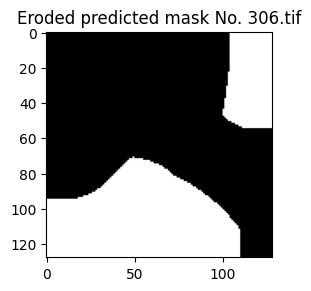

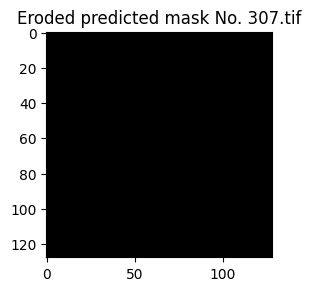

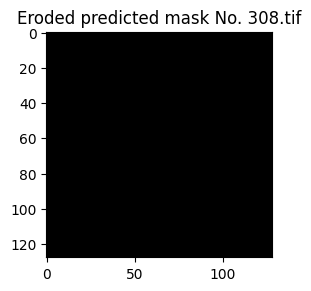

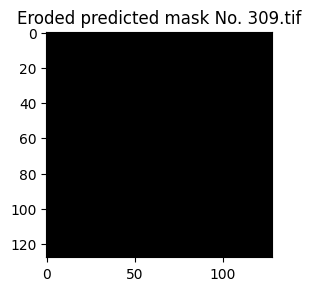

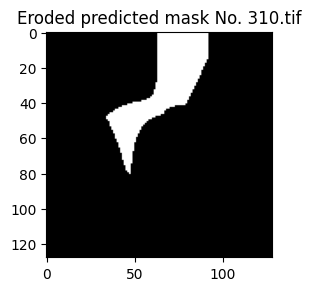

...

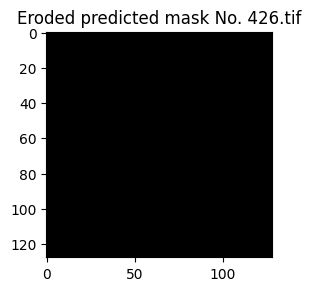

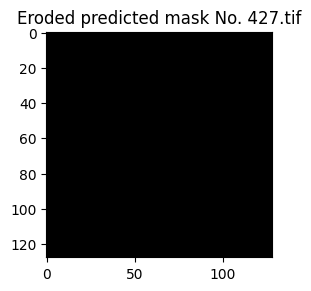

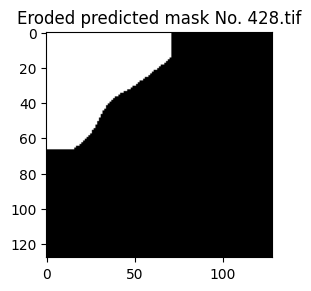

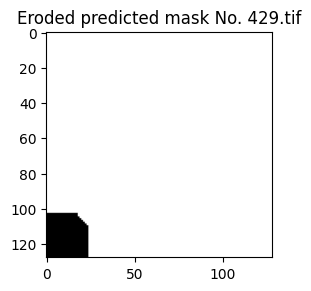

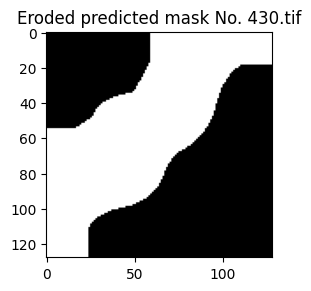

In [ ]:
# Load the state dictionary of the model, choose epoch
model_path = '/content/drive/MyDrive/opti-flood/saved_models/model_epoch_33.pth'
state_dict = torch.load(model_path)
model = CustomResNetSegmentationModel(in_channels)
model.load_state_dict(state_dict)

# Set the model to eval, get test set
model.eval()
test_dataset = DataCube_Dataset(root_dir=root_dir, bands = bands, phase='test', transform=transforms_Normalized)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

# Create a directory to save the predictions
output_dir = '/content/drive/MyDrive/opti-flood/predictions'
os.makedirs(output_dir, exist_ok=True)
#Define kernel
kernel = np.ones((3, 3), np.uint8)

# Iterate through the test set and make predictions
for sample in test_loader:
    image = sample['image']
    image = image.float()
    image_name = sample['image_name'][0]


    with torch.no_grad():
        output = model(image)

    # Convert the output to a binary mask (you might need to adjust this based on your model's output format)
    binary_mask = (output > 0.5).float()


    # Convert the binary mask to a numpy array
    predicted_mask = binary_mask.numpy().squeeze()
    eroded_image = cv2.erode(predicted_mask, kernel, iterations=1)
    plt.subplot(1, 2, 2)
    plt.imshow(eroded_image, cmap='gray')
    plt.title(f"Eroded predicted mask No. {image_name}")
    plt.show()
    # Save the prediction as a PNG image
    prediction_path = os.path.join(output_dir, f'{image_name}_prediction.png')
    Image.fromarray((eroded_image).astype(np.uint8)).save(prediction_path)

In [ ]:
# Assuming 'binary_image' is your binary image with pixel values 0 and 1
# Ensure it is a NumPy array
binary_image = np.array([[0, 0, 0, 0, 0],
                         [0, 1, 1, 0, 0],
                         [0, 1, 1, 1, 0],
                         [0, 0, 1, 0, 0],
                         [0, 0, 0, 0, 0]], dtype=np.uint8)

# Define a kernel for erosion (you can adjust the kernel size)
kernel = np.ones((3, 3), np.uint8)

# Perform erosion on the binary image
eroded_image = cv2.erode(binary_image, kernel, iterations=1)

# Print the original and eroded images
print("Original Image:")
print(binary_image)

print("\nEroded Image:")
print(eroded_image)

# Viz

Vizualization on validation set

Model: With QA band, **very low precision**

Epoch [33/50], Loss: 0.3305137488577101, Val Loss: 0.29604896903038025

              precision    recall  f1-score   support

            0.0       0.98      0.91      0.95    415777
            1.0       0.70      0.93      0.80     92127

    accuracy                               0.91    507904
    macro avg          0.84      0.92      0.87    507904
    weighted avg       0.93      0.91      0.92    507904

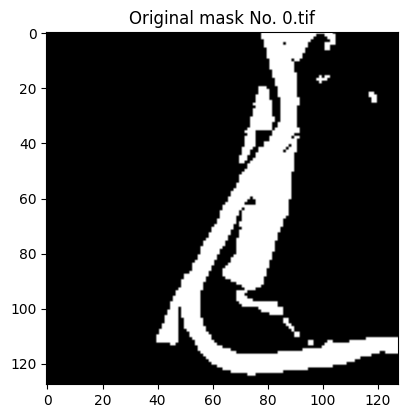

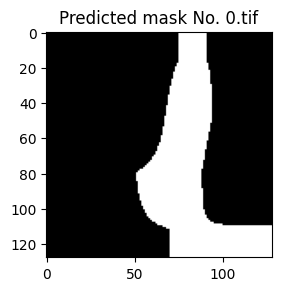

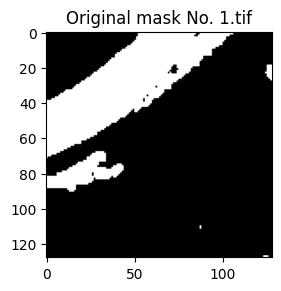

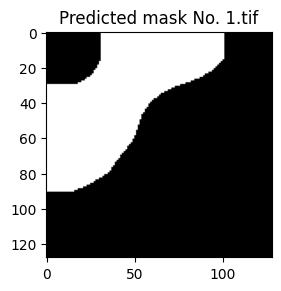

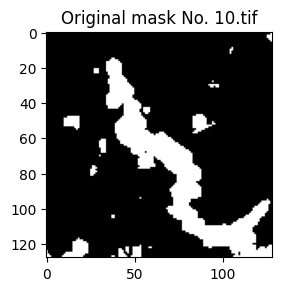

...

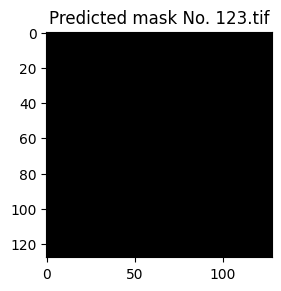

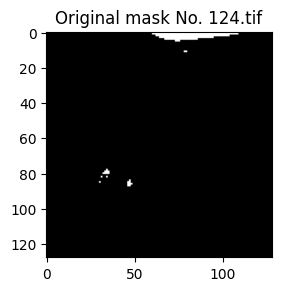

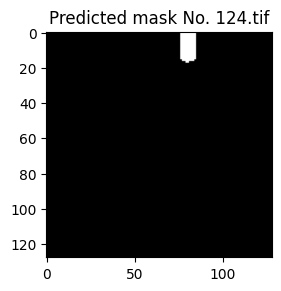

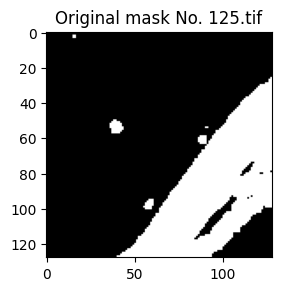

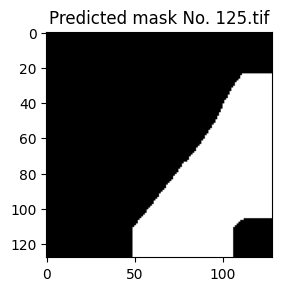

In [ ]:


# Load the state dictionary of the model, choose epoch
model_path = '/content/drive/MyDrive/opti-flood/saved_models/model_epoch_33.pth'
state_dict = torch.load(model_path)
model = CustomResNetSegmentationModel(in_channels)
model.load_state_dict(state_dict)

# Set the model to eval, get test set
model.eval()
valid_dataset = DataCube_Dataset(root_dir=root_dir, bands = bands, phase='val', transform=transforms_Normalized)
valid_loader = DataLoader(valid_dataset, batch_size=1, shuffle=False)

# Create a directory to save the predictions
# output_dir = '/content/drive/MyDrive/opti-flood/predictions'
# os.makedirs(output_dir, exist_ok=True)

plt.figure(figsize=(10, 5))

# Iterate through the test set and make predictions
for sample in valid_loader:
    image = sample['image']
    image = image.float()
    image_name = sample['image_name'][0]

    # Get mask and plot it
    image_mask = sample["mask"]
    image_mask = image_mask.numpy().squeeze()
    # plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(image_mask, cmap='gray')
    plt.title(f"Original mask No. {image_name}")
    plt.show()


    with torch.no_grad():
        output = model(image)
    # Convert the output to a binary mask (you might need to adjust this based on your model's output format)
    binary_mask = (output > 0.5).float()
    # Convert the binary mask to a numpy array
    predicted_mask = binary_mask.numpy().squeeze()
    plt.subplot(1, 2, 2)
    plt.imshow(predicted_mask, cmap='gray')
    plt.title(f"Predicted mask No. {image_name}")
    plt.show()

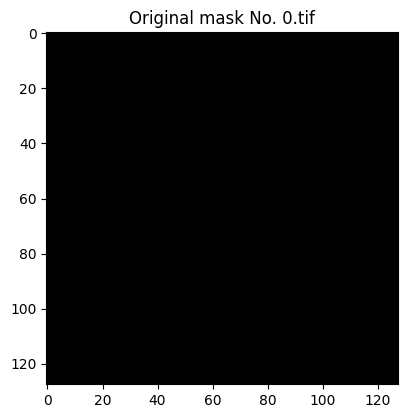

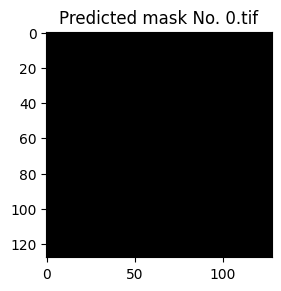

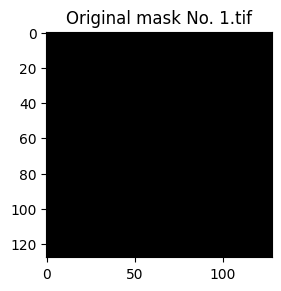

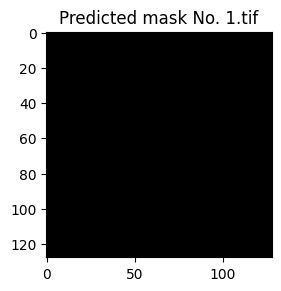

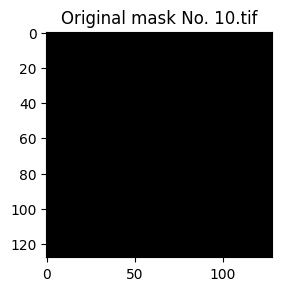

...

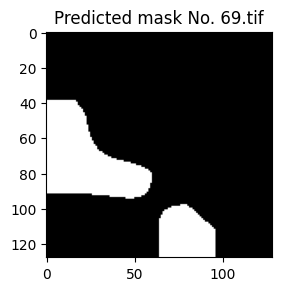

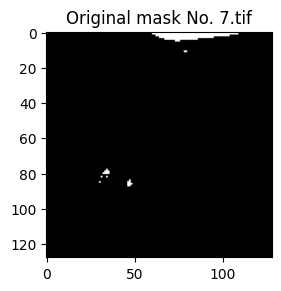

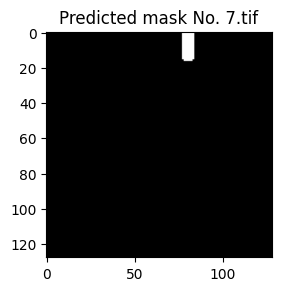

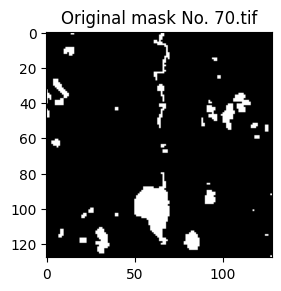

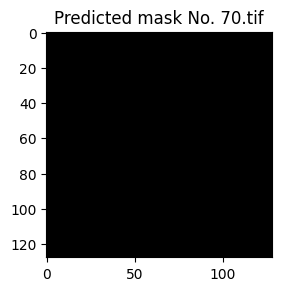

In [ ]:
# Let's run on a training set! To check if our model can capture small details, because we can see it does not at the validation set

# Load the state dictionary of the model, choose epoch
model_path = '/content/drive/MyDrive/opti-flood/saved_models/model_epoch_33.pth'
state_dict = torch.load(model_path)
model = CustomResNetSegmentationModel(in_channels)
model.load_state_dict(state_dict)

# Set the model to eval, get test set
model.eval()
train_dataset = DataCube_Dataset(root_dir=root_dir, bands = bands, phase='train', transform=transforms_Normalized)
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=False)

# Create a directory to save the predictions
# output_dir = '/content/drive/MyDrive/opti-flood/predictions'
# os.makedirs(output_dir, exist_ok=True)

plt.figure(figsize=(10, 5))

# Iterate through the test set and make predictions
for sample in train_loader:
    image = sample['image']
    image = image.float()
    image_name = sample['image_name'][0]

    # Get mask and plot it
    image_mask = sample["mask"]
    image_mask = image_mask.numpy().squeeze()
    # plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(image_mask, cmap='gray')
    plt.title(f"Original mask No. {image_name}")
    plt.show()


    with torch.no_grad():
        output = model(image)
    # Convert the output to a binary mask (you might need to adjust this based on your model's output format)
    binary_mask = (output > 0.5).float()
    # Convert the binary mask to a numpy array
    predicted_mask = binary_mask.numpy().squeeze()
    plt.subplot(1, 2, 2)
    plt.imshow(predicted_mask, cmap='gray')
    plt.title(f"Predicted mask No. {image_name}")
    plt.show()

# Deeplab

In [ ]:
import torch
import torch.nn as nn
from torchvision import models

class ModifiedDeepLabV3(nn.Module):
    def __init__(self, num_classes=21):
        super(ModifiedDeepLabV3, self).__init__()

        # Load the pre-trained DeepLabv3 model with a ResNet backbone
        self.deeplabv3 = models.segmentation.deeplabv3_resnet50(pretrained=True)

        # Adjust the first convolutional layer to accept 21 input channels
        # Replace the original first layer with a new one
        self.deeplabv3.backbone.conv1 = nn.Conv2d(21, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        # Modify the final classifier layer to output 1 channel
        self.deeplabv3.classifier[-1] = nn.Conv2d(256, 1, kernel_size=(1, 1))

    def forward(self, x):
        return self.deeplabv3(x)

# Create an instance of the modified DeepLabV3 model
model = ModifiedDeepLabV3()

# Display the modified model architecture
print(model)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ModifiedDeepLabV3(
  (deeplabv3): DeepLabV3(
    (backbone): IntermediateLayerGetter(
      (conv1): Conv2d(21, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True

In [ ]:
# DataLoader
train_dataset = DataCube_Dataset(root_dir=root_dir, bands=bands, phase='train', transform=transforms_Normalized)
valid_dataset = DataCube_Dataset(root_dir=root_dir, bands=bands, phase='val', transform=transforms_Normalized)
batch_size = 16
torch.multiprocessing.set_start_method('spawn', force=True)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False)
# Hyperparameters
learning_rate = 0.0001
num_epochs = 50

# Directory to save the trained models
save_dir = '/content/drive/MyDrive/opti-flood/saved_models'
os.makedirs(save_dir, exist_ok=True)

# weight = torch.tensor([0.1, 0.9]) # higher weight for positive class
# criterion = nn.BCEWithLogitsLoss(weight=weight)
# Initialize model, loss function, and optimizer
pos_weight = torch.tensor([0.75 / 0.25])  # weight for class 1 / weight for class 0
criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)

model = ModifiedDeepLabV3()
#criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Other optimizers
# optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)
# optimizer = optim.RMSprop(model.parameters(), lr=learning_rate)
# optimizer = optim.Adagrad(model.parameters(), lr=learning_rate)
# optimizer = optim.Adadelta(model.parameters(), lr=learning_rate)


# Training loop
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for batch in train_loader:
        inputs, labels = batch['image'].float(), batch['mask'].float()

        # Zero the gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(inputs)
        outputs = outputs['out'] # Add this as model produces ordered dict and not a tensor
        outputs = outputs.squeeze(1)

        labels = labels.squeeze(1)
        labels = labels.squeeze(1)

        # Calculate the loss
        loss = criterion(outputs, labels)

        # Backward pass and optimization
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    average_loss = running_loss / len(train_loader)
    model.eval()  # Set the model to evaluation mode
    val_loss = 0.0
    all_val_preds = []
    all_val_labels = []

    with torch.no_grad():
        for val_batch in val_loader:
            val_inputs, val_labels = val_batch['image'].float(), val_batch['mask'].float()
            val_outputs = model(val_inputs)
            val_outputs = val_outputs["out"]
            val_outputs = val_outputs.squeeze(1)
            val_labels = val_labels.squeeze(1)

            val_loss += criterion(val_outputs, val_labels).item()

            # Collect predictions and true labels for metrics
            all_val_preds.append(val_outputs.cpu().numpy())
            all_val_labels.append(val_labels.cpu().numpy())

    average_val_loss = val_loss / len(val_loader)

    # Flatten predictions and labels for metrics calculation
    all_val_preds = np.concatenate(all_val_preds)
    all_val_labels = np.concatenate(all_val_labels)

    # Set thershold for binary prediction
    threshold = 0.5
    binary_predictions = (all_val_preds >= threshold).astype(int)
    binary_predictions[all_val_preds < threshold] = 0

    # Print
    print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {average_loss}, Val Loss: {average_val_loss}')
    report = classification_report(all_val_labels.flatten(), binary_predictions.flatten())
    print(report)

    # Save the model
    model_save_path = os.path.join(save_dir, f'model_epoch_{epoch + 1}.pth')
    torch.save(model.state_dict(), model_save_path)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/50], Loss: 0.7945312062899271, Val Loss: 0.5642765462398529
              precision    recall  f1-score   support

         0.0       0.97      0.82      0.89    415777
         1.0       0.52      0.89      0.65     92127

    accuracy                           0.83    507904
   macro avg       0.74      0.85      0.77    507904
weighted avg       0.89      0.83      0.85    507904

Epoch [2/50], Loss: 0.5391935225990083, Val Loss: 0.4264114201068878
              precision    recall  f1-score   support

         0.0       0.95      0.92      0.94    415777
         1.0       0.69      0.79      0.74     92127

    accuracy                           0.90    507904
   macro avg       0.82      0.86      0.84    507904
weighted avg       0.90      0.90      0.90    507904

Epoch [3/50], Loss: 0.4841303908162647, Val Loss: 0.3380967229604721
              precision    recall  f1-score   support

         0.0       0.96      0.93      0.95    415777
         1.0       0.73      0

KeyboardInterrupt: 

In [ ]:
import cv2
import numpy as np

# Assuming 'binary_image' is your binary image with pixel values 0 and 1
# Ensure it is a NumPy array
binary_image = np.array([[0, 0, 0, 0, 0],
                         [0, 1, 1, 0, 0],
                         [0, 1, 1, 1, 0],
                         [0, 0, 1, 0, 0],
                         [0, 0, 0, 0, 0]], dtype=np.uint8)

# Define a kernel for erosion (you can adjust the kernel size)
kernel = np.ones((3, 3), np.uint8)

# Perform erosion on the binary image
eroded_image = cv2.erode(binary_image, kernel, iterations=1)

# Print the original and eroded images
print("Original Image:")
print(binary_image)

print("\nEroded Image:")
print(eroded_image)


Original Image:
[[0 0 0 0 0]
 [0 1 1 0 0]
 [0 1 1 1 0]
 [0 0 1 0 0]
 [0 0 0 0 0]]

Eroded Image:
[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]]


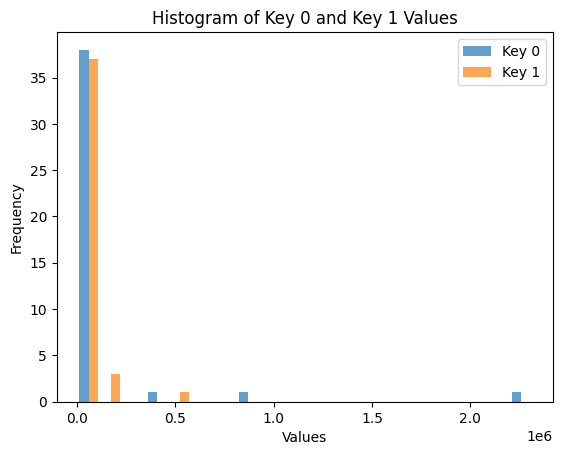

In [ ]:
data = {64: {'0': 2317133, '1': 222686},
 66: {'0': 2809, '1': 185},
 68: {'0': 11244, '1': 495},
 70: {'0': 414, '1': 15},
 72: {'0': 2436, '1': 29},
 74: {'0': 51, '1': 0},
 76: {'0': 564, '1': 16},
 78: {'0': 9, '1': 0},
 80: {'0': 22994, '1': 8813},
 84: {'0': 61, '1': 26},
 96: {'0': 37725, '1': 511362},
 100: {'0': 17, '1': 23},
 112: {'0': 1141, '1': 5775},
 116: {'0': 0, '1': 3},
 128: {'0': 867288, '1': 107019},
 130: {'0': 1244, '1': 83},
 132: {'0': 5465, '1': 986},
 134: {'0': 483, '1': 46},
 136: {'0': 784, '1': 54},
 138: {'0': 22, '1': 0},
 140: {'0': 173, '1': 25},
 142: {'0': 4, '1': 0},
 144: {'0': 5853, '1': 5202},
 148: {'0': 1, '1': 3},
 160: {'0': 19801, '1': 188261},
 164: {'0': 9, '1': 83},
 176: {'0': 1135, '1': 6361},
 192: {'0': 378148, '1': 52169},
 194: {'0': 2007, '1': 149},
 196: {'0': 7339, '1': 385},
 198: {'0': 581, '1': 41},
 200: {'0': 920, '1': 9},
 202: {'0': 30, '1': 0},
 204: {'0': 322, '1': 16},
 206: {'0': 2, '1': 0},
 208: {'0': 5781, '1': 6778},
 224: {'0': 13870, '1': 177152},
 228: {'0': 2, '1': 31},
 240: {'0': 3370, '1': 7926},
 244: {'0': 0, '1': 3},
 255: {'0': 0, '1': 62}}
# Plot the histogram
# Extract values for keys '0' and '1' separately
values_0 = [entry['0'] for entry in data.values()]
values_1 = [entry['1'] for entry in data.values()]

# Plot the histogram
plt.hist([values_0, values_1], bins=20, alpha=0.7, label=['Key 0', 'Key 1'])
plt.title('Histogram of Key 0 and Key 1 Values')
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.legend()
plt.show()


ValueError: `bins` must increase monotonically, when an array

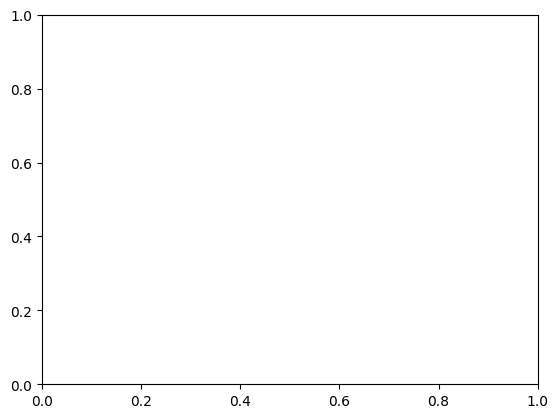

In [ ]:
import matplotlib.pyplot as plt

# The given dictionary
data = {64: 2094447, 66: 2624, 68: 10749, 70: 399, 72: 2407, 74: 51, 76: 548, 78: 9, 80: 14181, 84: 35, 96: -473637, 100: -6, 112: -4634, 116: -3, 128: 760269, 130: 1161, 132: 4479, 134: 437, 136: 730, 138: 22, 140: 148, 142: 4, 144: 651, 148: -2, 160: -168460, 164: -74, 176: -5226, 192: 325979, 194: 1858, 196: 6954, 198: 540, 200: 911, 202: 30, 204: 306, 206: 2, 208: -997, 224: -163282, 228: -29, 240: -4556, 244: -3, 255: -62}

# Extract the values from the dictionary
values = list(data.values())

# Create a histogram
plt.hist(data.keys(), values, color='blue', alpha=0.7)
plt.title('Histogram of Dictionary Values')
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.show()

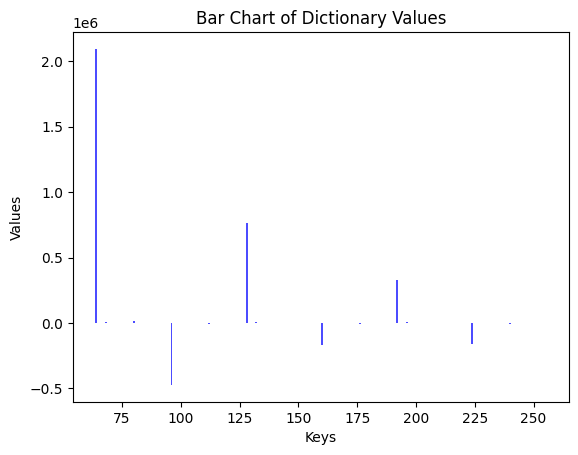

In [ ]:
import matplotlib.pyplot as plt

# The given dictionary
data = {64: 2094447, 66: 2624, 68: 10749, 70: 399, 72: 2407, 74: 51, 76: 548, 78: 9, 80: 14181, 84: 35, 96: -473637, 100: -6, 112: -4634, 116: -3, 128: 760269, 130: 1161, 132: 4479, 134: 437, 136: 730, 138: 22, 140: 148, 142: 4, 144: 651, 148: -2, 160: -168460, 164: -74, 176: -5226, 192: 325979, 194: 1858, 196: 6954, 198: 540, 200: 911, 202: 30, 204: 306, 206: 2, 208: -997, 224: -163282, 228: -29, 240: -4556, 244: -3, 255: -62}

# Plot the histogram
plt.bar(data.keys(), data.values(), color='blue', alpha=0.7)
plt.title('Bar Chart of Dictionary Values')
plt.xlabel('Keys')
plt.ylabel('Values')
plt.show()

In [ ]:
data = {64: {'0': 2317133, '1': 222686},
 66: {'0': 2809, '1': 185},
 68: {'0': 11244, '1': 495},
 70: {'0': 414, '1': 15},
 72: {'0': 2436, '1': 29},
 74: {'0': 51, '1': 0},
 76: {'0': 564, '1': 16},
 78: {'0': 9, '1': 0},
 80: {'0': 22994, '1': 8813},
 84: {'0': 61, '1': 26},
 96: {'0': 37725, '1': 511362},
 100: {'0': 17, '1': 23},
 112: {'0': 1141, '1': 5775},
 116: {'0': 0, '1': 3},
 128: {'0': 867288, '1': 107019},
 130: {'0': 1244, '1': 83},
 132: {'0': 5465, '1': 986},
 134: {'0': 483, '1': 46},
 136: {'0': 784, '1': 54},
 138: {'0': 22, '1': 0},
 140: {'0': 173, '1': 25},
 142: {'0': 4, '1': 0},
 144: {'0': 5853, '1': 5202},
 148: {'0': 1, '1': 3},
 160: {'0': 19801, '1': 188261},
 164: {'0': 9, '1': 83},
 176: {'0': 1135, '1': 6361},
 192: {'0': 378148, '1': 52169},
 194: {'0': 2007, '1': 149},
 196: {'0': 7339, '1': 385},
 198: {'0': 581, '1': 41},
 200: {'0': 920, '1': 9},
 202: {'0': 30, '1': 0},
 204: {'0': 322, '1': 16},
 206: {'0': 2, '1': 0},
 208: {'0': 5781, '1': 6778},
 224: {'0': 13870, '1': 177152},
 228: {'0': 2, '1': 31},
 240: {'0': 3370, '1': 7926},
 244: {'0': 0, '1': 3},
 255: {'0': 0, '1': 62}}

In [ ]:
result = {}

for key, values in data.items():
    result[key] = values['0'] - values['1']

print(result)

{64: 2094447, 66: 2624, 68: 10749, 70: 399, 72: 2407, 74: 51, 76: 548, 78: 9, 80: 14181, 84: 35, 96: -473637, 100: -6, 112: -4634, 116: -3, 128: 760269, 130: 1161, 132: 4479, 134: 437, 136: 730, 138: 22, 140: 148, 142: 4, 144: 651, 148: -2, 160: -168460, 164: -74, 176: -5226, 192: 325979, 194: 1858, 196: 6954, 198: 540, 200: 911, 202: 30, 204: 306, 206: 2, 208: -997, 224: -163282, 228: -29, 240: -4556, 244: -3, 255: -62}


In [ ]:
import statistics

# The given dictionary
data = {64: 2094447, 66: 2624, 68: 10749, 70: 399, 72: 2407, 74: 51, 76: 548, 78: 9, 80: 14181, 84: 35, 96: -473637, 100: -6, 112: -4634, 116: -3, 128: 760269, 130: 1161, 132: 4479, 134: 437, 136: 730, 138: 22, 140: 148, 142: 4, 144: 651, 148: -2, 160: -168460, 164: -74, 176: -5226, 192: 325979, 194: 1858, 196: 6954, 198: 540, 200: 911, 202: 30, 204: 306, 206: 2, 208: -997, 224: -163282, 228: -29, 240: -4556, 244: -3, 255: -62}

# Extract the values from the dictionary
values = list(data.values())

# Calculate mean and standard deviation
mean_value = statistics.mean(values)
std_deviation = statistics.stdev(values)

print("Mean:", mean_value)
print("Standard Deviation:", std_deviation)


Mean: 58755.12195121951
Standard Deviation: 360877.00416140363


In [ ]:
dict = {}
for key, value in data.items():
  dict[key] = (value -mean_value) / std_deviation

print(dict)

{64: 5.640957596561928, 66: -0.15554086656658966, 68: -0.1330262704401874, 70: -0.16170640212120446, 72: -0.15614217947236558, 74: -0.16267071959221838, 76: -0.16129351906608644, 78: -0.16278710273527178, 80: -0.12351610503639507, 84: -0.16271505602766728, 96: -1.4752730592750793, 100: -0.16282866814350513, 112: -0.17565298209710387, 116: -0.16282035506185846, 128: 1.9439140481642485, 130: -0.15959487938294986, 132: -0.15040061108173106, 134: -0.16160110308701328, 136: -0.16078919211285503, 138: -0.16275107938146952, 140: -0.16240192995230932, 142: -0.16280095787134954, 144: -0.16100810326288403, 148: -0.1628175840346429, 160: -0.6296192867129784, 164: -0.163017097994163, 176: -0.17729343020871374, 192: 0.7404846387199102, 194: -0.15766347341370648, 196: -0.14354231872322698, 198: -0.16131568728381088, 200: -0.16028763618683917, 202: -0.16272891116374508, 204: -0.16196410765225128, 206: -0.16280649992578067, 208: -0.1655747561141223, 224: -0.6152709077908233, 228: -0.16289240176946293,

In [ ]:
# The given dictionary
data = {64: 2094447, 66: 2624, 68: 10749, 70: 399, 72: 2407, 74: 51, 76: 548, 78: 9, 80: 14181, 84: 35, 96: -473637, 100: -6, 112: -4634, 116: -3, 128: 760269, 130: 1161, 132: 4479, 134: 437, 136: 730, 138: 22, 140: 148, 142: 4, 144: 651, 148: -2, 160: -168460, 164: -74, 176: -5226, 192: 325979, 194: 1858, 196: 6954, 198: 540, 200: 911, 202: 30, 204: 306, 206: 2, 208: -997, 224: -163282, 228: -29, 240: -4556, 244: -3, 255: -62}

# Extract the values from the dictionary
data = list(data.values())
# Calculate min and max values
min_value = min(data)
max_value = max(data)

# Min-Max scaling formula
normalized_data = [(x - min_value) / (max_value - min_value) for x in data]

print("Original data:", data)
print("Normalized data:", normalized_data)

Original data: [2094447, 2624, 10749, 399, 2407, 51, 548, 9, 14181, 35, -473637, -6, -4634, -3, 760269, 1161, 4479, 437, 730, 22, 148, 4, 651, -2, -168460, -74, -5226, 325979, 1858, 6954, 540, 911, 30, 306, 2, -997, -163282, -29, -4556, -3, -62]
Normalized data: [1.0, 0.18545382471912913, 0.18861766203909217, 0.18458742003766232, 0.18536932592547595, 0.18445191045152728, 0.1846454399466684, 0.18443555584630408, 0.18995406692304456, 0.18444568012572798, 0.0, 0.18442971491586724, 0.1826275931784163, 0.1844308831019546, 0.4804772741078563, 0.18488413930385456, 0.18617615311648683, 0.18460221706143567, 0.18471630990263557, 0.18444061798601602, 0.18448968180168562, 0.1844336088694918, 0.18468554766900147, 0.18443127249731706, 0.11883450852853723, 0.18440323603122016, 0.18239707112384174, 0.3113667621464095, 0.18515554787148708, 0.1871399066385679, 0.18464232478376877, 0.18478679046324029, 0.18444373314891568, 0.18455120626895383, 0.1844328300787669, 0.18404382411167236, 0.12085079771533953,

In [ ]:
# The given dictionary
data = {64: 2094447, 66: 2624, 68: 10749, 70: 399, 72: 2407, 74: 51, 76: 548, 78: 9, 80: 14181, 84: 35, 96: -473637, 100: -6, 112: -4634, 116: -3, 128: 760269, 130: 1161, 132: 4479, 134: 437, 136: 730, 138: 22, 140: 148, 142: 4, 144: 651, 148: -2, 160: -168460, 164: -74, 176: -5226, 192: 325979, 194: 1858, 196: 6954, 198: 540, 200: 911, 202: 30, 204: 306, 206: 2, 208: -997, 224: -163282, 228: -29, 240: -4556, 244: -3, 255: -62}

# Extract the values from the original dictionary
original_values = list(data.values())

# Calculate min and max values
min_value = min(original_values)
max_value = max(original_values)

# Min-Max scaling formula
normalized_data = {key: (value - min_value) / (max_value - min_value) for key, value in data.items()}

print("Original data:", data)
print("Normalized data:", normalized_data)

Original data: {64: 2094447, 66: 2624, 68: 10749, 70: 399, 72: 2407, 74: 51, 76: 548, 78: 9, 80: 14181, 84: 35, 96: -473637, 100: -6, 112: -4634, 116: -3, 128: 760269, 130: 1161, 132: 4479, 134: 437, 136: 730, 138: 22, 140: 148, 142: 4, 144: 651, 148: -2, 160: -168460, 164: -74, 176: -5226, 192: 325979, 194: 1858, 196: 6954, 198: 540, 200: 911, 202: 30, 204: 306, 206: 2, 208: -997, 224: -163282, 228: -29, 240: -4556, 244: -3, 255: -62}
Normalized data: {64: 1.0, 66: 0.18545382471912913, 68: 0.18861766203909217, 70: 0.18458742003766232, 72: 0.18536932592547595, 74: 0.18445191045152728, 76: 0.1846454399466684, 78: 0.18443555584630408, 80: 0.18995406692304456, 84: 0.18444568012572798, 96: 0.0, 100: 0.18442971491586724, 112: 0.1826275931784163, 116: 0.1844308831019546, 128: 0.4804772741078563, 130: 0.18488413930385456, 132: 0.18617615311648683, 134: 0.18460221706143567, 136: 0.18471630990263557, 138: 0.18444061798601602, 140: 0.18448968180168562, 142: 0.1844336088694918, 144: 0.18468554766

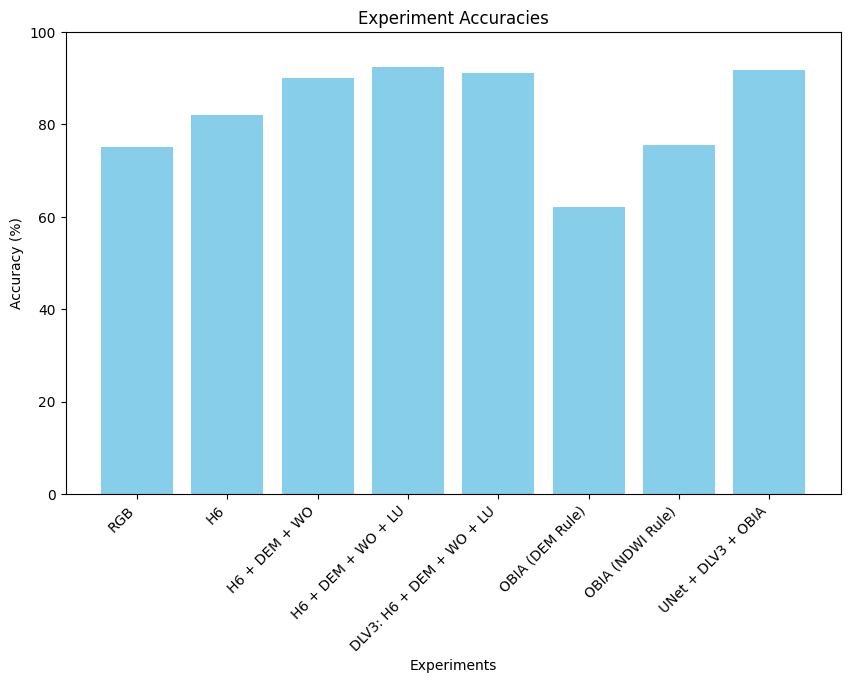

In [ ]:
import matplotlib.pyplot as plt

experiments = ['RGB', 'H6', 'H6 + DEM + WO', 'H6 + DEM + WO + LU', 'DLV3: H6 + DEM + WO + LU', 'OBIA (DEM Rule)', 'OBIA (NDWI Rule)', 'UNet + DLV3 + OBIA']
accuracy = [75, 82, 90, 92.4, 91.2, 62.1, 75.5, 91.8]

plt.figure(figsize=(10, 6))
plt.bar(experiments, accuracy, color='skyblue')
plt.xlabel('Experiments')
plt.ylabel('Accuracy (%)')
plt.title('Experiment Accuracies')
plt.ylim(0, 100)  # Optional: Set y-axis limit for better visualization
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability

plt.show()


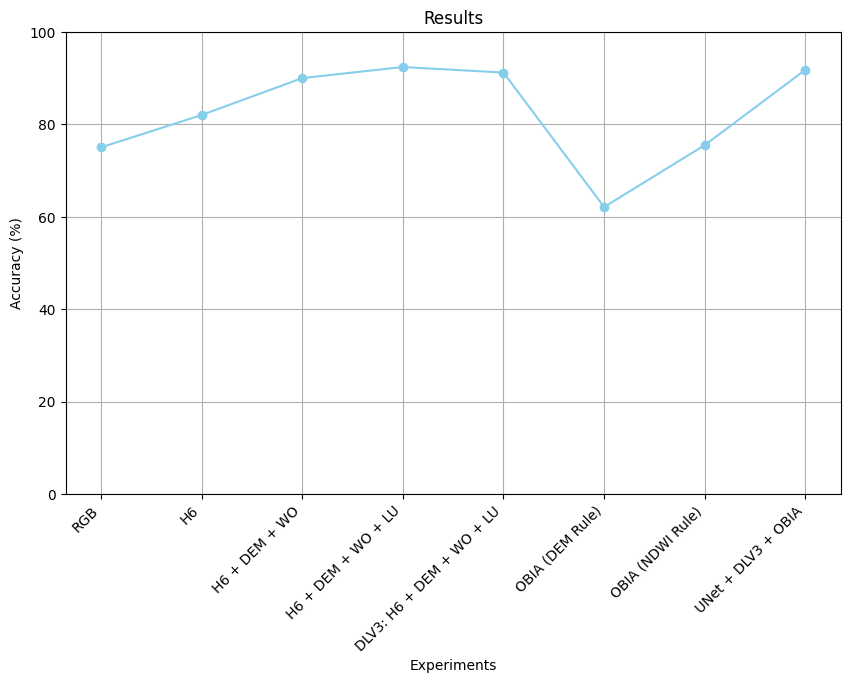

In [ ]:
import matplotlib.pyplot as plt

experiments = ['RGB', 'H6', 'H6 + DEM + WO', 'H6 + DEM + WO + LU', 'DLV3: H6 + DEM + WO + LU', 'OBIA (DEM Rule)', 'OBIA (NDWI Rule)', 'UNet + DLV3 + OBIA']
accuracy = [75, 82, 90, 92.4, 91.2, 62.1, 75.5, 91.8]

plt.figure(figsize=(10, 6))
plt.plot(experiments, accuracy, marker='o', linestyle='-', color='skyblue')
plt.xlabel('Experiments')
plt.ylabel('Accuracy (%)')
plt.title('Results')
plt.ylim(0, 100)  # Optional: Set y-axis limit for better visualization
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability

plt.grid(True)
plt.show()